In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
import numpy as np
from scipy.cluster import hierarchy
from scipy.spatial.distance import pdist
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import IsolationForest
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import warnings
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from math import sqrt
import joblib
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression
from datetime import timedelta,date
import lightgbm as lgb
from itertools import product
import numpy as np
import time

# from fbprophet import Prophet
warnings.filterwarnings("ignore")

In [ ]:
data = pd.read_csv('Products_Information.csv')
data.head()

,id,date,store_nbr,product_type,sales,special_offer
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


## Summary Statistics:

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column         Dtype  
---  ------         -----  
 0   id             int64  
 1   date           object 
 2   store_nbr      int64  
 3   product_type   object 
 4   sales          float64
 5   special_offer  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.4+ MB


In [4]:
data['date'] = pd.to_datetime(data['date'], format='%Y-%m-%d')
data.describe().T

# date was object time, hence converted to datetime
# total 30L records
# sales for >25% products is zero
# almost half of products are low quantity selling products

,count,mean,std,min,25%,50%,75%,max
id,3000888.0,1.500444e+06,866281.891642,0.0,750221.75,1500443.5,2.250665e+06,3000887.0
store_nbr,3000888.0,2.750000e+01,15.585787,1.0,14.00,27.5,4.100000e+01,54.0
sales,3000888.0,3.577757e+02,1101.997721,0.0,0.00,11.0,1.958473e+02,124717.0
special_offer,3000888.0,2.602770e+00,12.218882,0.0,0.00,0.0,0.000000e+00,741.0


In [5]:
data['store_nbr'].nunique(), data['product_type'].nunique() 
# total stores 54
# total products 33

(54, 33)

## Data Consistency Check:

In [6]:
data_check = data.groupby(['store_nbr','product_type','date'])['id'].count().reset_index()
data_check[data_check['id']>1]

# no duplicates

,store_nbr,product_type,date,id


## Missing Data Check:

In [7]:
data.isna().sum(axis=0)
# no nulls

id               0
date             0
store_nbr        0
product_type     0
sales            0
special_offer    0
dtype: int64

In [8]:
store_occurences = data['store_nbr'].value_counts().unique()
print (store_occurences)

# data present for each product's sales for each day at each store even when the outlet doesn't sell that product
if len(store_occurences)==1:
    print (int(store_occurences[0]/(data['product_type'].nunique())), 'days')
    print (data['date'].max()-data['date'].min()+timedelta(days=1))
# four days missing

[55572]
1684 days
1688 days 00:00:00


### 25th Dec: Stores Closed

In [9]:
complete_date_range = pd.date_range(start=data['date'].min(), end=data['date'].max(), freq='D')

missing_dates = set(complete_date_range) - set(data['date'])

missing_dates_df = pd.DataFrame({'missing_dates': sorted(list(missing_dates))})
    
print(missing_dates_df)
# all outlets remain closed on Christmas

  missing_dates
0    2013-12-25
1    2014-12-25
2    2015-12-25
3    2016-12-25


## Feature Engineering (Basic):

In [10]:
data['year'] = data['date'].dt.year
data['month'] = data['date'].dt.month
data['day'] = data['date'].dt.day
data['dow'] = data['date'].dt.dayofweek
data['week_num'] = data['date'].dt.isocalendar().week
data.head()

,id,date,store_nbr,product_type,sales,special_offer,year,month,day,dow,week_num
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013,1,1,1,1
1,1,2013-01-01,1,BABY CARE,0.0,0,2013,1,1,1,1
2,2,2013-01-01,1,BEAUTY,0.0,0,2013,1,1,1,1
3,3,2013-01-01,1,BEVERAGES,0.0,0,2013,1,1,1,1
4,4,2013-01-01,1,BOOKS,0.0,0,2013,1,1,1,1


# EDA : Sales Pattern

## Analysis 1 (wrt Stores):

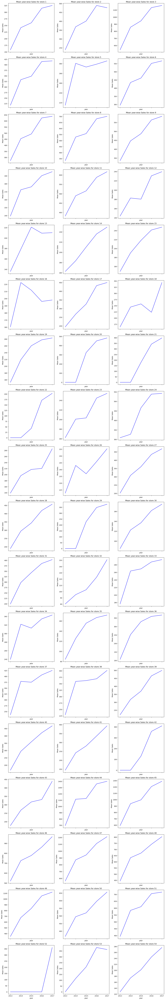

In [11]:
df = data.copy()
unique_stores = df['store_nbr'].unique()

num_rows = math.ceil(len(unique_stores) / 3)
num_cols = min(len(unique_stores), 3)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), sharex=True)


for i, store in enumerate(sorted(unique_stores.tolist())):
    row_idx = i // 3
    col_idx = i % 3

    store_data = df[df['store_nbr'] == store].groupby(['year'])['sales'].mean()
    store_data = store_data.reset_index()
    
    axes[row_idx, col_idx].plot(store_data['year'], store_data['sales'], label=f'Mean Sales - {store}', c = 'blue')
    axes[row_idx, col_idx].set_xticks(store_data['year'])
    axes[row_idx, col_idx].set_xlabel('year')
    axes[row_idx, col_idx].set_ylabel('Mean Sales')
    axes[row_idx, col_idx].set_title(f'Mean year-wise Sales for store {store}')

plt.tight_layout()
plt.show()

# Similar patterns of sales observed between some stores, hence can be clustered
# 52: opened at 2017 (no prev sales)
# 42, 29, 22, 21, 20: started in 2014
# Generally increasing sales year to year

## Analysis 2 (wrt Product):

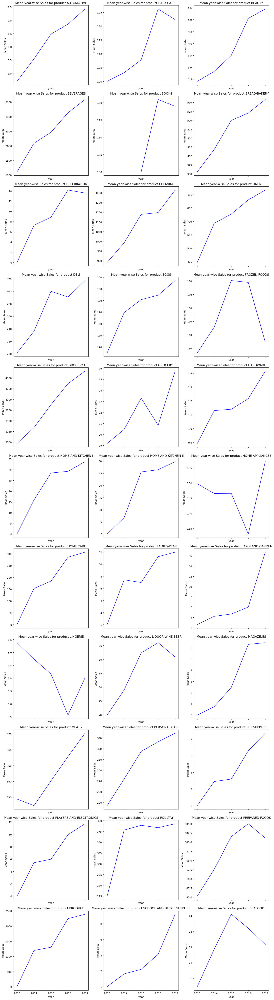

In [12]:
df = data.copy()
unique_products = df['product_type'].unique()

num_rows = math.ceil(len(unique_products) / 3)
num_cols = min(len(unique_products), 3)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), sharex=True)


for i, product in enumerate(sorted(unique_products.tolist())):
    row_idx = i // 3
    col_idx = i % 3

    product_data = df[df['product_type'] == product].groupby(['year'])['sales'].mean()
    product_data = product_data.reset_index()
    
    axes[row_idx, col_idx].plot(product_data['year'], product_data['sales'], label=f'Mean Sales - {product}', c = 'blue')
    axes[row_idx, col_idx].set_xticks(product_data['year'])
    axes[row_idx, col_idx].set_xlabel('year')
    axes[row_idx, col_idx].set_ylabel('Mean Sales')
    axes[row_idx, col_idx].set_title(f'Mean year-wise Sales for product {product}')

plt.tight_layout()
plt.show()

# Most products have different sales pattern, hence clustering not applied
# Also, since the aim is inventory management, it makes sense to not create clusters of products 
# Books started selling from 2015
# Many products sell in lower quantity
# High quantity selling products are mostly daily usage products such as dairy, grocery I etc., also these products have lower shelf life compared to others (major focus on their prediction)

### Adding start_date column

In [13]:
df = data.copy()
df = df[df['sales']>0]
df = df.groupby(['product_type','store_nbr'])['date'].min().reset_index()
df = df.rename(columns = {'date':'start_date'})
data = pd.merge(data, df, how='left', on=['product_type','store_nbr'])
data.head()
# some products started selling at a later point in time
# some stores still don't sell some products

,id,date,store_nbr,product_type,sales,special_offer,year,month,day,dow,week_num,start_date
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013,1,1,1,1,2013-01-02
1,1,2013-01-01,1,BABY CARE,0.0,0,2013,1,1,1,1,NaT
2,2,2013-01-01,1,BEAUTY,0.0,0,2013,1,1,1,1,2013-01-02
3,3,2013-01-01,1,BEVERAGES,0.0,0,2013,1,1,1,1,2013-01-02
4,4,2013-01-01,1,BOOKS,0.0,0,2013,1,1,1,1,2016-10-13


## Analysis 3 (wrt Day of Week + Anomaly Detection): 

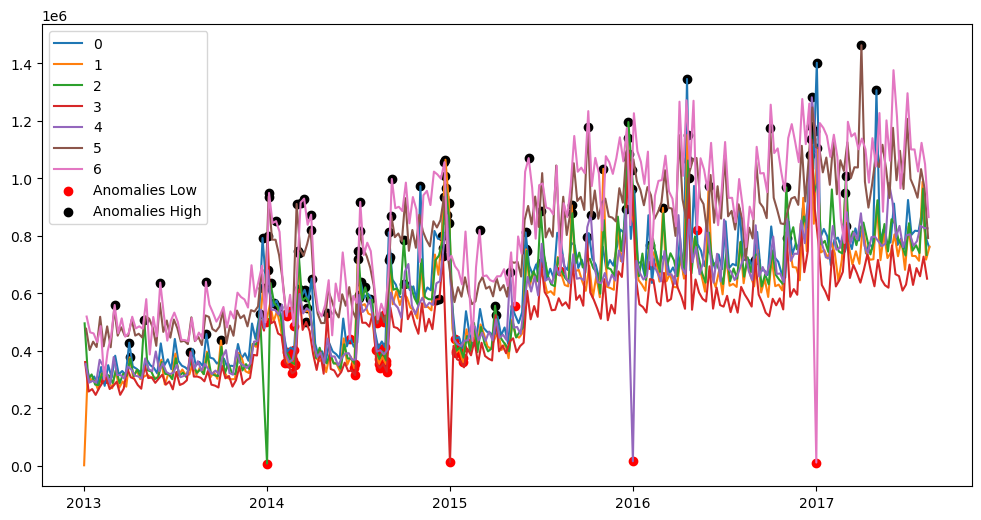

In [14]:
daily_sales = data.copy()
daily_sales = daily_sales.groupby(['date','dow'])['sales'].sum().reset_index()

## rolling period
n= 5

daily_sales.sort_values(by = 'date', inplace=True)

#####
rolling_avg_prev = daily_sales.groupby('dow')['sales'].rolling(n, min_periods = n-1, closed = 'left').mean().reset_index()
rolling_avg_prev.set_index('level_1', inplace=True)
rolling_avg_prev.rename(columns = {'sales': 'sales_prev'},inplace=True)
rolling_avg_prev = rolling_avg_prev[['sales_prev']]

daily_sales.sort_values(by = 'date', ascending=False, inplace=True)
rolling_avg_post = daily_sales.groupby('dow')['sales'].rolling(n, min_periods = n-1, closed = 'left').mean().reset_index()
rolling_avg_post.set_index('level_1', inplace=True)
rolling_avg_post.rename(columns = {'sales': 'sales_post'},inplace=True)
rolling_avg_post = rolling_avg_post[['sales_post']]

daily_sales = pd.concat([daily_sales, rolling_avg_prev, rolling_avg_post],axis=1)
daily_sales.sort_values(by = ['dow','date'], inplace=True)
####


daily_sales['sales_avg'] = (daily_sales['sales_prev'] + daily_sales['sales_post'])/2
daily_sales['sales_factor'] = (daily_sales['sales'] - daily_sales['sales_avg'])/daily_sales['sales_avg']
daily_sales['sales_pattern'] = np.where(daily_sales['sales_factor'] > 0.25, 'High', np.where(daily_sales['sales_factor'] < -0.25, 'Low', 'Normal'))

anomalies = daily_sales[daily_sales['sales_pattern'].isin(['High','Low'])]


daily_sales = pd.concat([daily_sales, rolling_avg_prev, rolling_avg_post],axis=1)
daily_sales.sort_values(by = ['dow','date'], inplace=True)

plt.figure(figsize=(12, 6))

for day, row in daily_sales.groupby('dow'):
    plt.plot(row['date'], row['sales'], label=day)

plt.scatter(daily_sales[daily_sales['sales_pattern']=='Low']['date'], daily_sales[daily_sales['sales_pattern']=='Low']['sales'], color='red', label='Anomalies Low')
plt.scatter(daily_sales[daily_sales['sales_pattern']=='High']['date'], daily_sales[daily_sales['sales_pattern']=='High']['sales'], color='black', label='Anomalies High')
plt.legend()
plt.show()

# Inference:
# YoY increase in sales
# 2013 quite low sales
# 2014 lot of fluctuation in sales (unstable)
# 2015 first half sudden dip in sales
# starting from 2nd half 2015 sales became quite stable with minimal random jumps
# saturday and sunday highest sales throughout
# lowest sales mostly on thursdays

### Identifying Repetitive Sales Anomalies:

In [15]:
anomalies['month'] = anomalies['date'].dt.month
anomalies['day'] = anomalies['date'].dt.day
anomalies.sort_values(by = 'date', inplace=True)

# Identify repeated anomalies
repeated_dates = anomalies.groupby(['month','day','sales_pattern']).size()

repeated_dates = repeated_dates[repeated_dates >= 3].reset_index()

repeated_dates[['month','day','sales_pattern']]

# High sales were observed at the start of the month in most months (maybe due to salary)
# Low repetative sales on 1st Jan
# December faces a lot of rise in sales

,month,day,sales_pattern
0,1,1,Low
1,3,1,High
2,4,1,High
3,5,1,High
4,9,1,High
5,9,2,High
6,10,1,High
7,11,3,High
8,12,18,High
9,12,21,High


### Data Reduction Based on Analysis 1 & 3:

In [16]:
data_backup = data.copy()

In [17]:
# stable sales pattern observed after july 2015
# many stores didn't open till 2015
data = data[((data['year']==2015) & (data['month']>=7)) | (data['year']>=2016)]
data.head()

,id,date,store_nbr,product_type,sales,special_offer,year,month,day,dow,week_num,start_date
1619838,1619838,2015-07-01,1,AUTOMOTIVE,5.0,0,2015,7,1,2,27,2013-01-02
1619839,1619839,2015-07-01,1,BABY CARE,0.0,0,2015,7,1,2,27,NaT
1619840,1619840,2015-07-01,1,BEAUTY,5.0,1,2015,7,1,2,27,2013-01-02
1619841,1619841,2015-07-01,1,BEVERAGES,2638.0,2,2015,7,1,2,27,2013-01-02
1619842,1619842,2015-07-01,1,BOOKS,0.0,0,2015,7,1,2,27,2016-10-13


### Understanding Lag Features

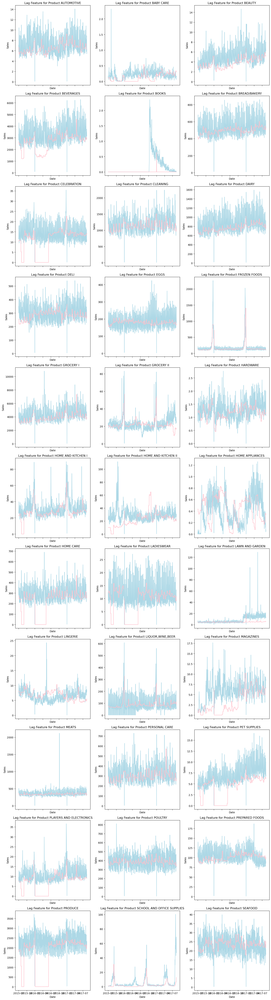

In [18]:
df = data_backup.copy()
lag_data = df.groupby(['product_type','store_nbr','year','week_num'])['sales'].mean().reset_index(name='lag_yoy_sales')
lag_data['year'] = lag_data['year']+1
df = pd.merge(df, lag_data, how='left', on = ['product_type','store_nbr','year','week_num'])
df = df[df['date']>='2015-07-01']

unique_products = df['product_type'].unique()

num_rows = math.ceil(len(unique_products) / 3)
num_cols = min(len(unique_products), 3)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), sharex=True)

for i, product in enumerate(unique_products):
    row_idx = i // 3
    col_idx = i % 3

    product_data = df[df['product_type'] == product].groupby(['date'])[['sales','lag_yoy_sales']].mean()
    product_data = product_data.reset_index()


    axes[row_idx, col_idx].plot(product_data['date'], product_data['sales'], label=f'Mean Sales - {product}', c = 'lightblue')
    axes[row_idx, col_idx].plot(product_data['date'], product_data['lag_yoy_sales'], label=f'Previous Year Same Week No. Mean Sales - {product}', c = 'pink')
    axes[row_idx, col_idx].set_xlabel('Date')
    axes[row_idx, col_idx].set_ylabel('Sales')
    axes[row_idx, col_idx].set_title(f'Lag Feature for Product {product}')

plt.tight_layout()
plt.show()

## Analysis 4 (wrt Special Offer):

### Monthly Sales vs Special Offer Distribution

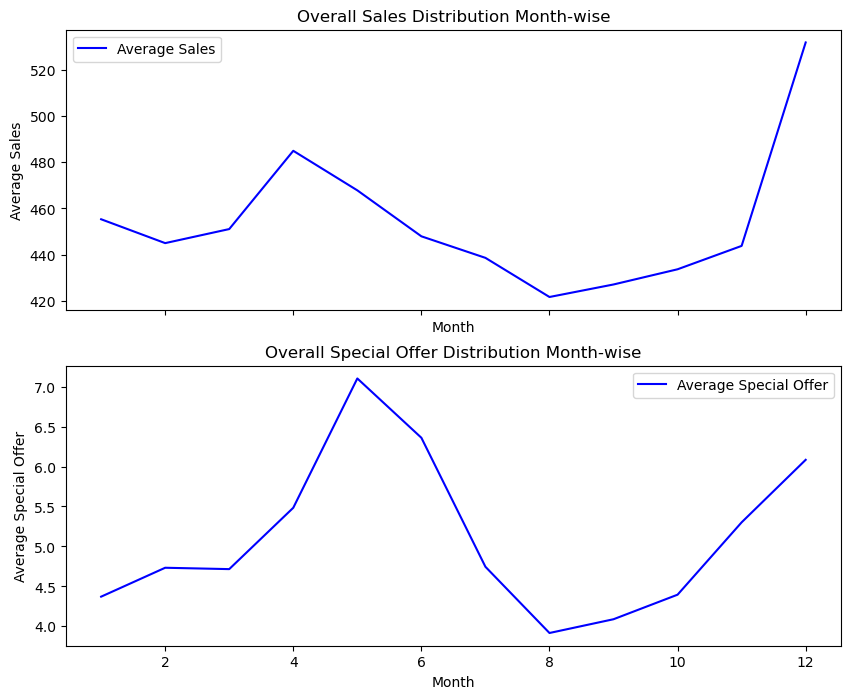

In [20]:
df = data.copy()
monthly_data = df.groupby(['month']).agg({'sales': 'mean', 'special_offer': 'mean'}).reset_index()

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

ax1.plot(monthly_data['month'], monthly_data['sales'], label='Average Sales', color='blue')
ax1.set_xlabel('Month')
ax1.set_ylabel('Average Sales')
ax1.set_title('Overall Sales Distribution Month-wise')
ax1.legend()

ax2.plot(monthly_data['month'], monthly_data['special_offer'], label='Average Special Offer', color='blue')
ax2.set_xlabel('Month')
ax2.set_ylabel('Average Special Offer')
ax2.set_title('Overall Special Offer Distribution Month-wise')
ax2.legend()

plt.show()

# little similarity observed b/w sales and special offer over months
# jan,feb, and aug have a major sales drop
# sales hike in may and december
# high offers during april, may, june, november, and december
# best offers offered around festival christmas and easter

### DOW-wise Sales vs Special Offer distribution for each year

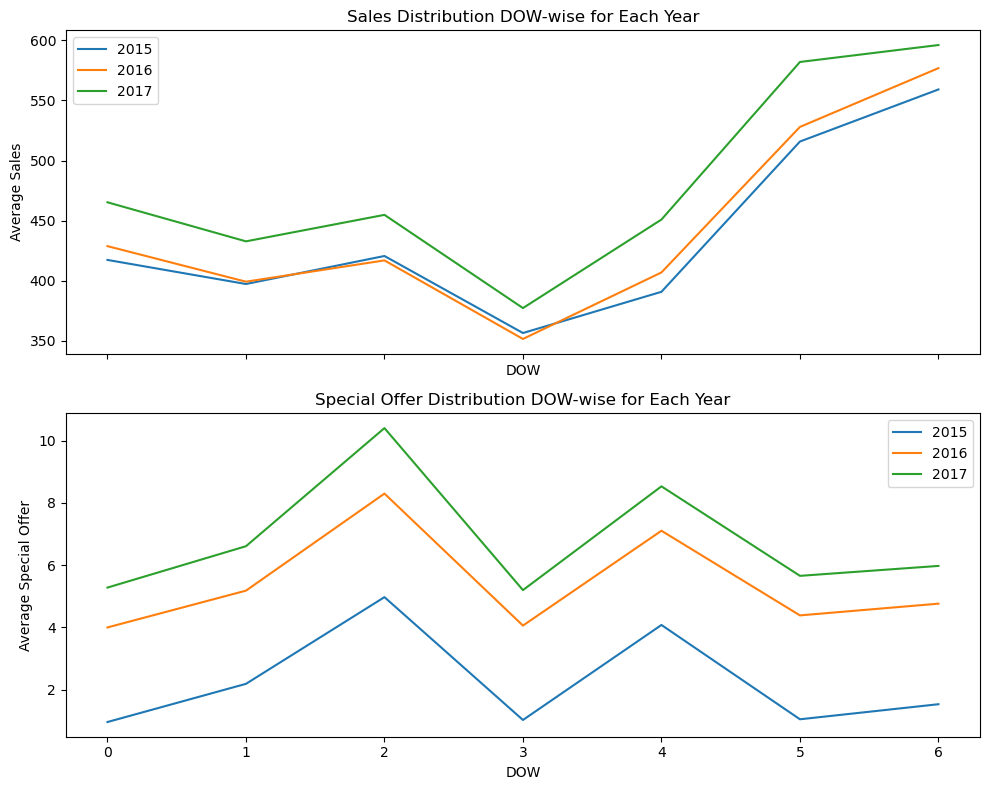

In [21]:
df = data.copy()
dow_data = df.groupby(['year', 'dow']).agg({'sales': 'mean', 'special_offer': 'mean'}).reset_index()

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)


for year in dow_data['year'].unique():
    year_data = dow_data[dow_data['year'] == year]
    ax1.plot(year_data['dow'], year_data['sales'], label=str(year))


ax1.set_xlabel('DOW')
ax1.set_ylabel('Average Sales')
ax1.set_title('Sales Distribution DOW-wise for Each Year')
ax1.legend()


for year in dow_data['year'].unique():
    year_data = dow_data[dow_data['year'] == year]
    ax2.plot(year_data['dow'], year_data['special_offer'], label=str(year))


ax2.set_xlabel('DOW')
ax2.set_ylabel('Average Special Offer')
ax2.set_title('Special Offer Distribution DOW-wise for Each Year')
ax2.legend()

plt.tight_layout()
plt.show()

# very similar pattern observed for dow
# weekend has higher sales compared to weekdays
# wednesdays have highest offers
# special offer not much effective, dow is much more effective wrt sales

# EDA : Product Specific Pattern + Clustering Possibility

## Analysis 1 (Product-wise Monthly Sales Distribution):

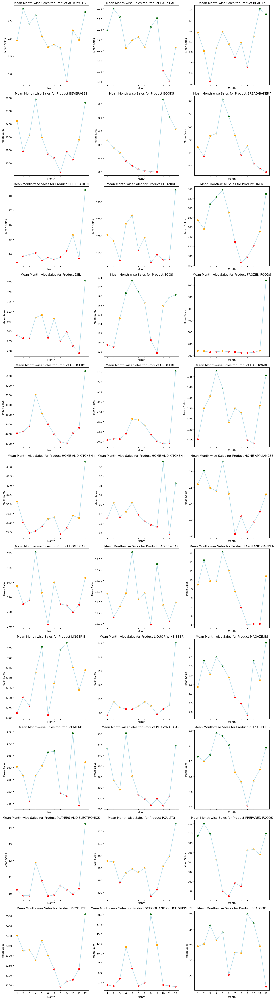

In [22]:
df = data.copy()
unique_products = df['product_type'].unique()

num_rows = math.ceil(len(unique_products) / 3)
num_cols = min(len(unique_products), 3)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), sharex=True)


for i, product in enumerate(unique_products):
    row_idx = i // 3
    col_idx = i % 3

    product_data = df[df['product_type'] == product].groupby(['month','product_type'])['sales'].mean()
    product_data = product_data.reset_index()

    X = product_data['sales'].values

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X.reshape(-1, 1))

    # Apply KMeans clustering
    kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
    y_pred = kmeans.fit_predict(X_scaled)
    
    ordered_labels = np.argsort(kmeans.cluster_centers_.sum(axis=1))
    label_mapping = {old_label: new_label for new_label, old_label in enumerate(ordered_labels)}
    y_pred = pd.Series(y_pred).map(label_mapping)
    
    
    
    color_map = {0:'red', 1:'orange', 2:'darkgreen'}
    color_label = pd.Series(y_pred).map(color_map)

    axes[row_idx, col_idx].plot(product_data['month'], product_data['sales'], label=f'Mean Sales - {product}', c = 'lightblue')
    axes[row_idx, col_idx].scatter(product_data['month'], product_data['sales'], label=f'Mean Sales - {product}', c = color_label)
    axes[row_idx, col_idx].set_xticks(product_data['month'])
    axes[row_idx, col_idx].set_xlabel('Month')
    axes[row_idx, col_idx].set_ylabel('Mean Sales')
    axes[row_idx, col_idx].set_title(f'Mean Month-wise Sales for Product {product}')

plt.tight_layout()
plt.show()

# Different products have different sales range as observed in EDA 1
# Clustering of products based on their monthly avg sales
# Months with similar avg sales grouped together
# 3 clusters have been created overall (High, Medium, and Low sales category)
# Can be used for modelling

## Analysis 2 (Product-wise Day of Month Sales Distribution):

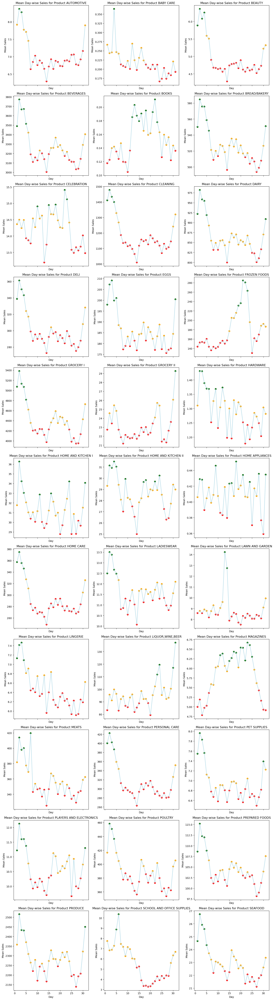

In [23]:
df = data.copy()
unique_products = df['product_type'].unique()

num_rows = math.ceil(len(unique_products) / 3)
num_cols = min(len(unique_products), 3)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), sharex=True)

for i, product in enumerate(unique_products):
    row_idx = i // 3
    col_idx = i % 3

    product_data = df[df['product_type'] == product].groupby(['day','product_type'])['sales'].mean()
    product_data = product_data.reset_index()

    X = product_data['sales'].values

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X.reshape(-1, 1))

    # Apply KMeans clustering
    kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
    y_pred = kmeans.fit_predict(X_scaled)
    
    ordered_labels = np.argsort(kmeans.cluster_centers_.sum(axis=1))
    label_mapping = {old_label: new_label for new_label, old_label in enumerate(ordered_labels)}
    y_pred = pd.Series(y_pred).map(label_mapping)
    
    color_map = {0:'red', 1:'orange', 2:'darkgreen'}
    color_label = pd.Series(y_pred).map(color_map)

    axes[row_idx, col_idx].plot(product_data['day'], product_data['sales'], label=f'Mean Sales - {product}', c = 'lightblue')
    axes[row_idx, col_idx].scatter(product_data['day'], product_data['sales'], label=f'Mean Sales - {product}', c = color_label)
    axes[row_idx, col_idx].set_xlabel('Day')
    axes[row_idx, col_idx].set_ylabel('Mean Sales')
    axes[row_idx, col_idx].set_title(f'Mean Day-wise Sales for Product {product}')

plt.tight_layout()
plt.show()
 
# Clustering of products based on their daily avg sales as observed earlier udring EDA 1
# Days with similar avg sales grouped together
# Most products have highest sales at the start of the month
# Some have well defined clusters (can be used for modelling) while some do not
# 3 clusters have been created overall (High, Medium, and Low sales category)    

## Analysis 3 (Most Selling Products (MSP)):

In [24]:
fig = px.bar(data.groupby(['year', 'product_type']).sales.sum().sort_values(ascending=False).reset_index(),
             x='product_type', y='sales', color='product_type', facet_row='year',
             title="Yearly Contribution of Each Product Type to Total Sales",
             labels={'sales': 'Mean Sales', 'product_type': 'Product Type'},
             category_orders={'year': sorted(data['year'].unique())})

fig.update_layout(height=1400) 

fig.show()

# HOMECARE, BOOKS,  was not present in 2013 and were introduced in 2014
# Majority sales contribution from Grocery & Beverages
# We need to predict correctly the products that majorly contribute to sales

### MSP: Products with more than 5% contribution to total yearly sales

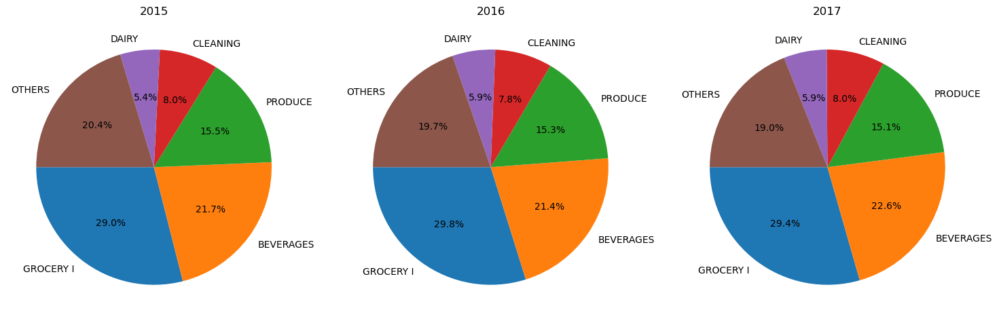

In [25]:
grouped_data = data.groupby(['year', 'product_type']).sales.mean().reset_index()

grouped_data['percentage_contribution'] = grouped_data.groupby('year')['sales'].transform(lambda x: (x / x.sum()) * 100)
msp = pd.pivot_table(grouped_data, values='percentage_contribution', index='product_type', columns='year')
msp = msp.sort_values(by=2017, ascending = False)
msp = msp[(msp[2015]>5) | (msp[2016]>5) | (msp[2017]>5)]

msp_list = list(msp.index)

other_products = pd.DataFrame(100-msp.sum()).T
other_products['product_type'] = 'OTHERS'
other_products.set_index('product_type', inplace=True, drop=True)
msp = pd.concat([msp,other_products])


# plot pie charts
def pie_chart(data, title, axs):
    sns.set_palette("Set3")

    axes[axs].pie(data, labels=data.index, autopct='%1.1f%%', startangle=180)
    axes[axs].set_title(title)


ig, axes = plt.subplots(1, 3, figsize=(15, 5))
pie_chart(msp[2015],'2015',0)
pie_chart(msp[2016],'2016',1)
pie_chart(msp[2017],'2017',2)
plt.tight_layout()
plt.show()

# Approx. 80% contribution from these 5 products and 50% only from grocery I and beverages

## Analysis 4 (Product-wise Special Offers Distribution):

### Correlation Matrix b/w special offer on products and sales

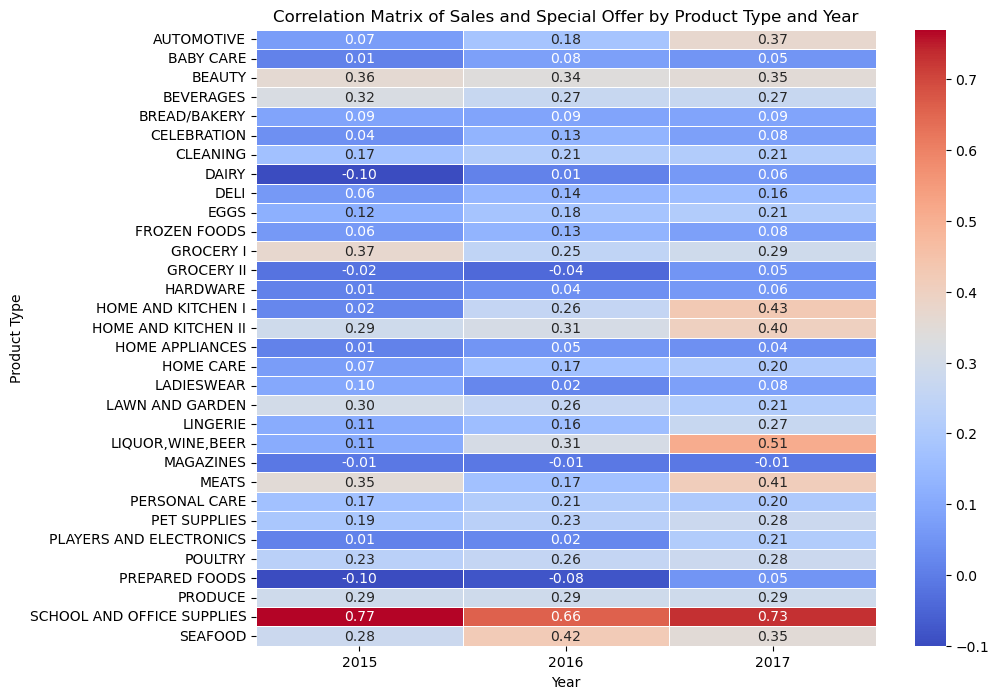

In [26]:
correlation_data = []

for product_type in data['product_type'].unique():
    for year in data['year'].unique():
        subset_data = data[(data['product_type'] == product_type) & (data['year'] == year)]
        correlation_value = subset_data[['special_offer', 'sales']].corr().iloc[0, 1]

        
        correlation_data.append({
            'product_type': product_type,
            'year': year,
            'correlation': correlation_value
        })


correlation_df =  pd.DataFrame(correlation_data)
table_data = pd.pivot_table(correlation_df, values='correlation', index='product_type', columns='year')

table_data = table_data.round(2)


plt.figure(figsize=(10, 8))
sns.heatmap(table_data, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Sales and Special Offer by Product Type and Year')
plt.xlabel('Year')
plt.ylabel('Product Type')
plt.show()

# Not all offers on products lead to increase in sales
# special offer feature can be used for modelling only for few products that have dependencies on special offer for sales hike
# school and office supplies have a remarkable correlation

### Products with > 20 % correlation of sales & special offer

In [27]:
table_data = table_data[ (table_data[2015]>0.2) & (table_data[2016]>0.2) & (table_data[2017]>0.2)]
special_offer_products = table_data.index.tolist()
table_data
# Special offer feature will be used only for these products

year,2015,2016,2017
product_type,,,
BEAUTY,0.36,0.34,0.35
BEVERAGES,0.32,0.27,0.27
GROCERY I,0.37,0.25,0.29
HOME AND KITCHEN II,0.29,0.31,0.40
LAWN AND GARDEN,0.30,0.26,0.21
POULTRY,0.23,0.26,0.28
PRODUCE,0.29,0.29,0.29
SCHOOL AND OFFICE SUPPLIES,0.77,0.66,0.73
SEAFOOD,0.28,0.42,0.35


### Product-wise Monthly Special Offers Distribution Clusters:

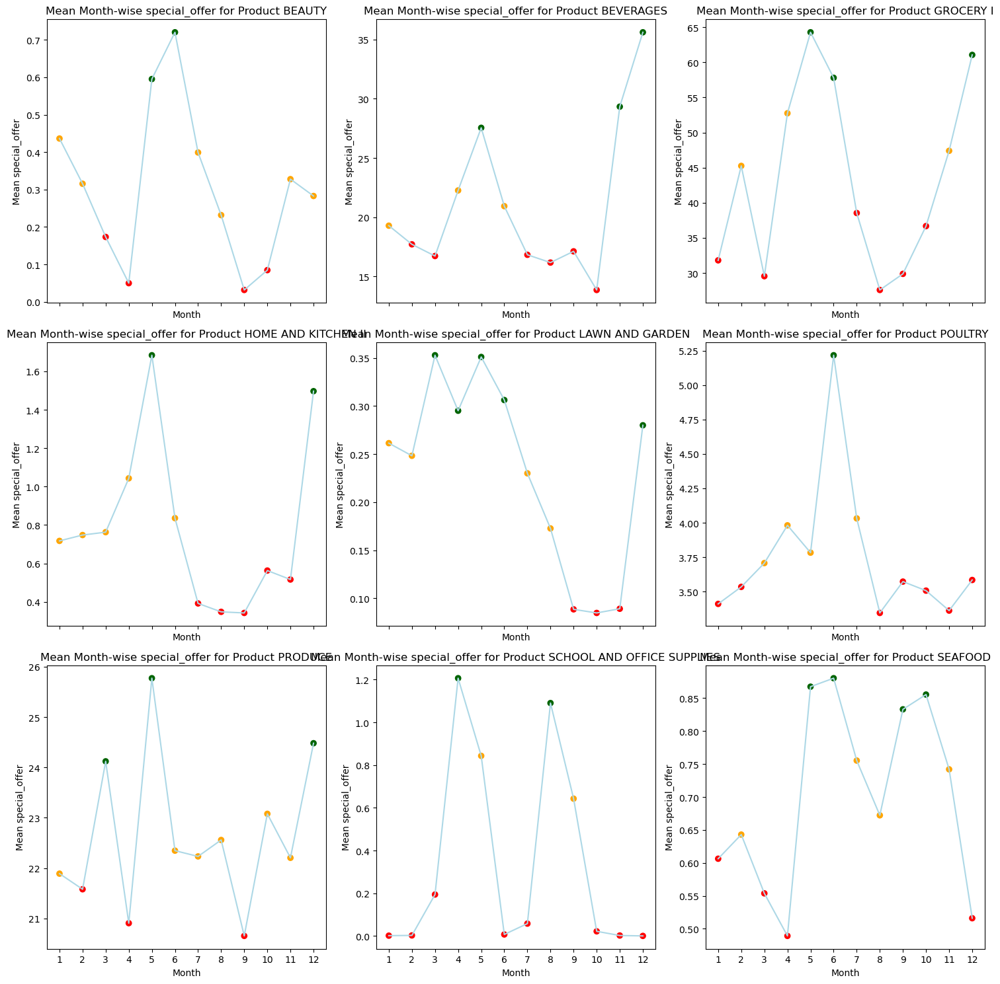

In [28]:
df = data.copy()
df = df[df['product_type'].isin(special_offer_products)]
unique_products = df['product_type'].unique()

num_rows = math.ceil(len(unique_products) / 3)
num_cols = min(len(unique_products), 3)


fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), sharex=True)

product_final_data = pd.DataFrame()

for i, product in enumerate(unique_products):
    row_idx = i // 3
    col_idx = i % 3

    product_data = df[df['product_type'] == product].groupby(['month','product_type'])['special_offer'].mean()
    product_data = product_data.reset_index()

    X = product_data['special_offer'].values

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X.reshape(-1, 1))

    # Apply KMeans clustering
    kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
    y_pred = kmeans.fit_predict(X_scaled)
    
    ordered_labels = np.argsort(kmeans.cluster_centers_.sum(axis=1))
    label_mapping = {old_label: new_label for new_label, old_label in enumerate(ordered_labels)}
    y_pred = pd.Series(y_pred).map(label_mapping)
    
    
    color_map = {0:'red', 1:'orange', 2:'darkgreen'}
    color_label = pd.Series(y_pred).map(color_map)

    axes[row_idx, col_idx].plot(product_data['month'], product_data['special_offer'], label=f'Mean special_offer - {product}', c = 'lightblue')
    axes[row_idx, col_idx].scatter(product_data['month'], product_data['special_offer'], label=f'Mean special_offer - {product}', c = color_label)
    axes[row_idx, col_idx].set_xticks(product_data['month'])
    axes[row_idx, col_idx].set_xlabel('Month')
    axes[row_idx, col_idx].set_ylabel('Mean special_offer')
    axes[row_idx, col_idx].set_title(f'Mean Month-wise special_offer for Product {product}')

plt.tight_layout()
plt.show()

# Books have no offer
# High offers on most products around april-may as observed in EDA 1

# EDA : Store Specific Pattern + Clustering Possibility

## Analysis 1 (Correlation b/w Sales of Stores):

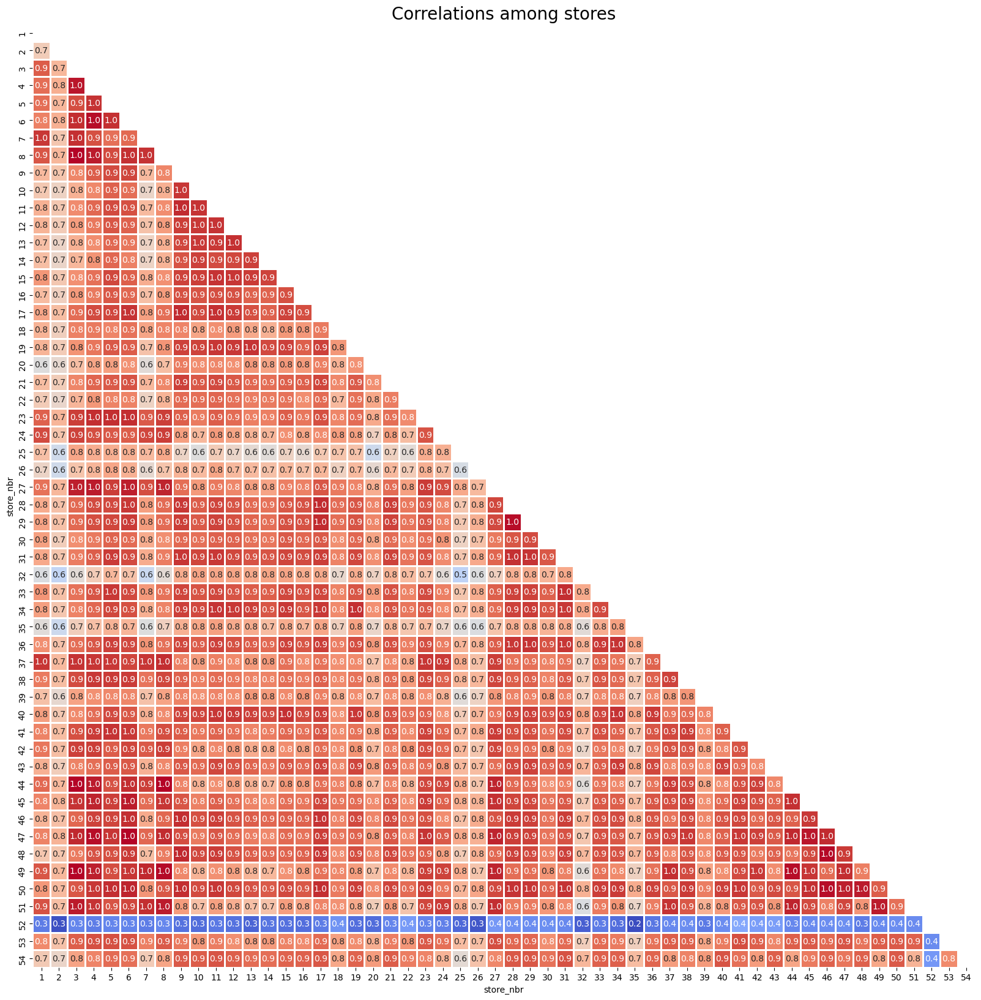

In [29]:
data_cpy = data.copy()
data_cpy['group_index'] = 1
data_cpy['group_index'] = data_cpy.groupby('store_nbr')['group_index'].cumsum().values
data_cpy = pd.pivot(data_cpy, index='group_index', columns='store_nbr', values='sales')
data_cpy = data_cpy.corr()


plt.figure(figsize=(20, 20))
sns.heatmap(
    data_cpy,
    annot=True,
    fmt=".1f",
    cmap="coolwarm",
    square=True,
    mask=np.triu(data_cpy),
    linewidths=1,
    cbar=False,
)
plt.title("Correlations among stores", fontsize=20)
plt.show()

# Most of the stores are correlated, hence can be clustered 
# outlet 52 has the least correlation as it was opened in 2017 (need to be careful while modelling)
# Since, different products follow different sales ranges and trends, and also our aim is inventory management, if would be a wiser decision to cluster stores for each product separately

### Product-wise Store Clustering

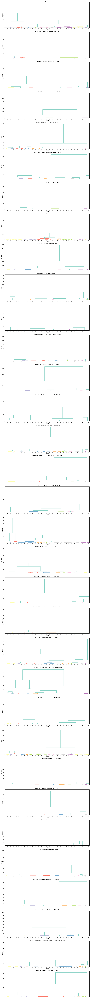

In [30]:
df = data.copy()
unique_products = df['product_type'].unique()
num_rows = len(unique_products)

cluster_info_df = pd.DataFrame(columns=['Product', 'Cluster_Count'])

fig, axes = plt.subplots(num_rows, 1, figsize=(15, 5*num_rows), sharex=True)


for i, product in enumerate(unique_products):
    product_data = df[df['product_type'] == product]

    pivot_df = pd.pivot_table(product_data, values='sales', index='store_nbr', fill_value=0)

    distances = pdist(pivot_df)
    linkage_matrix = hierarchy.linkage(distances, method='ward')

    
    height_threshold = 0.05 * np.max(linkage_matrix[:, 2]) 
    clusters = hierarchy.fcluster(linkage_matrix, height_threshold, criterion='distance')

    
    store_clusters = dict(zip(pivot_df.index, clusters))
    
    product_data.loc[product_data['product_type'] == product,'product_store_cluster'] = product_data.loc[product_data['product_type'] == product,'store_nbr'].map(store_clusters)
    
    avg_sales_per_cluster = product_data.groupby('product_store_cluster')['sales'].mean()
    sorted_clusters = avg_sales_per_cluster.sort_values().index
    
    cluster_order_mapping = {cluster: new_cluster_num for new_cluster_num, cluster in enumerate(sorted_clusters, start=1)}
   
    store_clusters = {store: cluster_order_mapping[store_clusters[store]] for store in store_clusters}
  
    num_clusters = len(set(clusters))
    store_count_per_cluster = pd.Series(clusters).value_counts()
    
    cluster_info = pd.DataFrame({
        'Product': [product],
        'Cluster_Count': [num_clusters]
    })
    
   
    cluster_info_df = pd.concat([cluster_info_df, cluster_info], ignore_index=True)
    
    hierarchy.dendrogram(linkage_matrix, labels=pivot_df.index, orientation='top', distance_sort='descending', color_threshold=height_threshold, ax=axes[i])
    axes[i].set_title(f'Hierarchical Clustering Dendrogram - {product}')
    axes[i].set_xlabel('Stores')
    axes[i].set_ylabel('Distance')

plt.tight_layout()
plt.show()


### Stores Clusters Info

In [31]:
cluster_info_df

,Product,Cluster_Count
0,AUTOMOTIVE,12
1,BABY CARE,9
2,BEAUTY,11
3,BEVERAGES,12
4,BOOKS,8
5,BREAD/BAKERY,11
6,CELEBRATION,11
7,CLEANING,11
8,DAIRY,10
9,DELI,11


## Analysis 2 (Product unavailability wrt stores):

### Products never sold in a store:

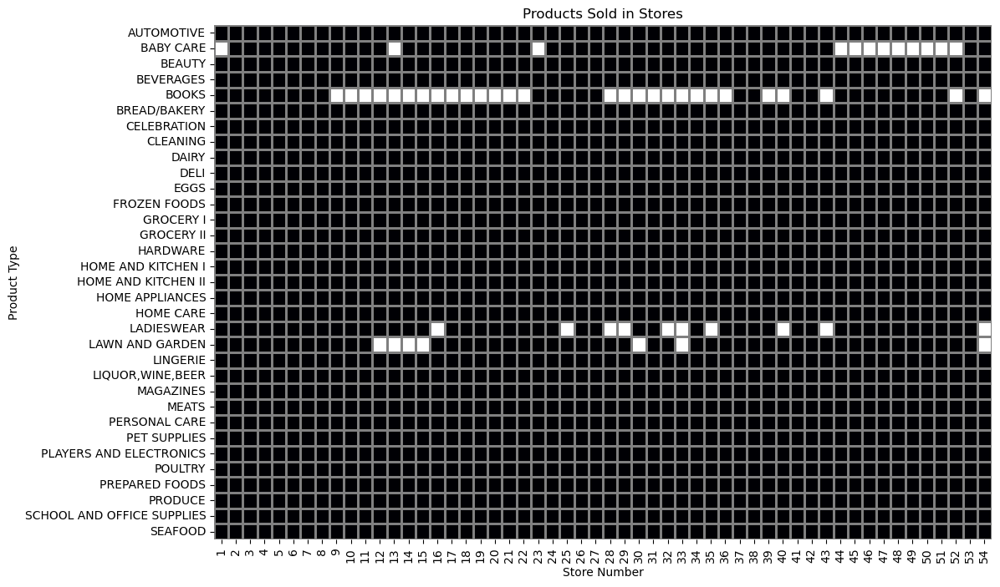

In [32]:
sales_data = data.groupby(['store_nbr', 'product_type'])['sales'].sum().reset_index()

heatmap_data = sales_data.pivot_table(index='product_type', columns='store_nbr', values='sales', fill_value=0)

zero_sales_mask = heatmap_data == 0

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data.notnull(), cmap='magma', cbar=False, annot=False, vmin=0, vmax=heatmap_data.max().max(), linewidths=1, linecolor='gray', mask=zero_sales_mask)
plt.title('Products Sold in Stores')
plt.xlabel('Store Number')
plt.ylabel('Product Type')
plt.show()

# Many stores do not sell books
# Most of the stores sell all products

### Temporary inactive products on store level (based on recent sales):

In [33]:
df = data.copy()

recent_sales = df[(df['date'] > df['date'].max() - pd.DateOffset(days=15))]
recent_sales = recent_sales.drop(columns = ['date'])

zero_sales = recent_sales.groupby(['store_nbr', 'product_type'])['sales'].sum().reset_index()
zero_sales = zero_sales[zero_sales['sales']==0][['product_type','store_nbr']]
zero_sales

# Needs to be handled during modelling
# Prediction for unavailable products will be set to 0

,product_type,store_nbr
1,BABY CARE,1
4,BOOKS,1
17,HOME APPLIANCES,1
31,SCHOOL AND OFFICE SUPPLIES,1
34,BABY CARE,2
...,...,...
1753,BOOKS,54
1768,LADIESWEAR,54
1769,LAWN AND GARDEN,54
1775,PET SUPPLIES,54


# EDA : Random/Special Events (Highlighting Outliers)

In [34]:
# Based on basic anomaly detection, we reduced the dataset to contain data from july 2015
# Now, we will be delving deeper into remaining anomalies (post july 2015)
# This study will be product based as our model will be on product level

## Analysis 1: Unusual sales jump/dip

In [35]:
data_cpy = data.copy()
df = data_cpy[data_cpy['sales']!=0]
df = df.groupby(['product_type','month'])['sales'].mean()
df = df.reset_index().rename(columns = {'sales':'mean_sales'})

data_cpy = pd.merge(data_cpy, df, on = ['product_type','month'])
data_cpy['sales_outlier'] = (abs((data_cpy['sales']-data_cpy['mean_sales'])/data_cpy['mean_sales'])>15).astype(int)

print('Percent outliers in terms of sales:', round(len(data_cpy[data_cpy['sales_outlier']==1])/len(data_cpy)*100,2))

# outliers to be calculated and handled in the training dataset

Percent outliers in terms of sales: 0.01


In [36]:
data_c = data.copy()
# df = data_c[data_c['sales']!=0]
df = data_c.groupby(['product_type','month'])['special_offer'].mean()
df = df.reset_index().rename(columns = {'special_offer':'mean_special_offer'})

data_c = pd.merge(data_c, df, on = ['product_type','month'])
data_c['offer_outlier'] = (abs((data_c['special_offer']-data_c['mean_special_offer'])/data_c['mean_special_offer'])>2).astype(int)

print('Percent outliers in terms of special offers:', round(len(data_c[data_c['offer_outlier']==1])/len(data_c)*100,2))
# outliers to be calculated and handled in the training dataset

Percent outliers in terms of special offers: 6.23


### Visualisation for outliers

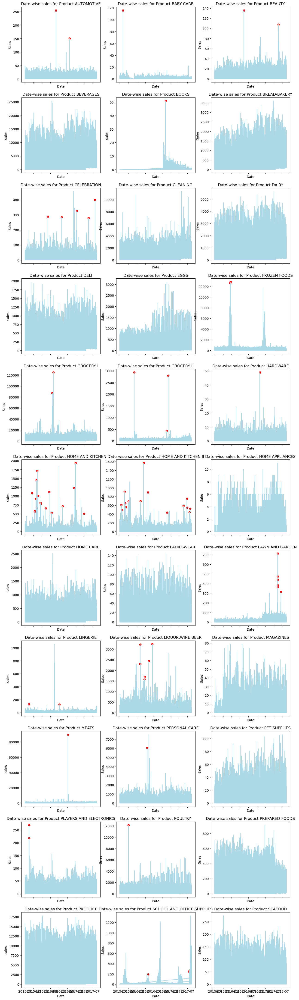

In [37]:


data_cpy = pd.merge(data_cpy, data_c[['id','offer_outlier']], on=['id'])
unique_products = data_cpy['product_type'].unique()

num_rows = math.ceil(len(unique_products) / 3)
num_cols = min(len(unique_products), 3)


fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), sharex=True)


for i, product in enumerate(unique_products):
    row_idx = i // 3
    col_idx = i % 3

    product_data = data_cpy[data_cpy['product_type'] == product]
    product_data_outlier = product_data[(product_data['sales_outlier']==1)&(product_data['offer_outlier']!=1)]

    product_date = product_data.sort_values(by=['product_type','store_nbr','date'])
    product_data_outlier = product_data_outlier.sort_values(by='date')
    axes[row_idx, col_idx].plot(product_data['date'], product_data['sales'], label=f'Sales - {product}', c = 'lightblue')
    axes[row_idx, col_idx].scatter(product_data_outlier['date'], product_data_outlier['sales'], c = 'red')
    axes[row_idx, col_idx].set_xlabel('Date')
    axes[row_idx, col_idx].set_ylabel('Sales')
    axes[row_idx, col_idx].set_title(f'Date-wise sales for Product {product}')

# plt.tight_layout()
plt.show()

# outliers are selected such that there was a hike/dip in sales which was 15 times the avg sales of that product for that month 
# out of these identified outliers, such points will be dropped where the sales hike is contributed due to high offers
# for eg. office supplies has random high sales but minimal outliers due to high offers
# on the other hand, home and kitchen has a lot of random behaviour which will make it difficult to predict accurately

In [38]:
data.head()

,id,date,store_nbr,product_type,sales,special_offer,year,month,day,dow,week_num,start_date
1619838,1619838,2015-07-01,1,AUTOMOTIVE,5.0,0,2015,7,1,2,27,2013-01-02
1619839,1619839,2015-07-01,1,BABY CARE,0.0,0,2015,7,1,2,27,NaT
1619840,1619840,2015-07-01,1,BEAUTY,5.0,1,2015,7,1,2,27,2013-01-02
1619841,1619841,2015-07-01,1,BEVERAGES,2638.0,2,2015,7,1,2,27,2013-01-02
1619842,1619842,2015-07-01,1,BOOKS,0.0,0,2015,7,1,2,27,2016-10-13


# Modelling:

## Preprocessing

In [39]:
class ModelPreprocessing:
    
    from sklearn.cluster import KMeans
    from sklearn.preprocessing import StandardScaler
    
    def __init__(self, dataset, level):
        self.dataset = dataset
        self.level = level
        
    # Drop outlier wrt target variable
    def drop_outliers(self, target_variable, comparison_variable, frequency_level = 'month', unique_identifier='id' ,outlier_factor=15, comparison_factor=2):
        # select only after start date
        self.dataset[(self.dataset['date']>=self.dataset['start_date'])]
        
        data_sales = self.dataset.copy()

        df = data_sales[data_sales[target_variable]!=0]
        df = df.groupby([self.level,frequency_level])[target_variable].mean()
        
        df = df.reset_index().rename(columns = {target_variable:'mean_target_var'})

        data_sales = pd.merge(data_sales, df, on = [self.level,frequency_level])
        data_sales['target_outlier'] = (abs((data_sales[target_variable]-data_sales['mean_target_var'])/data_sales['mean_target_var'])>outlier_factor).astype(int)


        data_offer = self.dataset.copy()
        df = data_offer.groupby([self.level,frequency_level])[comparison_variable].mean()
        df = df.reset_index().rename(columns = {comparison_variable:'mean_comparison_var'})

        data_offer = pd.merge(data_offer, df, on = [self.level,frequency_level])
        data_offer['comparison_outlier'] = (abs((data_offer[comparison_variable]-data_offer['mean_comparison_var'])/data_offer['mean_comparison_var'])>comparison_factor).astype(int)


        data_sales = pd.merge(data_sales, data_offer[[unique_identifier,'comparison_outlier']], on=[unique_identifier])
        data_sales = data_sales[(data_sales['target_outlier']==1)&(data_sales['comparison_outlier']!=1)]

        self.dataset = pd.merge(self.dataset, data_sales[[unique_identifier]], on = unique_identifier, how='left', indicator=True).query('_merge=="left_only"').drop('_merge', axis=1)

        return self.dataset

    
    # Functions that create strong relative clusters as discussed in EDA
    def get_freq_group_cluster(self, new_col, frequency, grouping_col, n=3):

        data_type = self.dataset['type'].unique().tolist()

        freq_data = self.dataset.groupby([frequency,self.level])[grouping_col].mean()
        freq_data = freq_data.reset_index()

        X = freq_data[grouping_col].values

        # Creating cluster using KMeans
        pipeline = Pipeline([
                        ('scaler', StandardScaler()),
                        ('cluster', KMeans(n_clusters=n, random_state=42, n_init=10))
                    ])

        X_train_scaled = pipeline.named_steps['scaler'].fit_transform(X.reshape(-1, 1))
        y_pred = pipeline.named_steps['cluster'].fit_predict(X_train_scaled)

        # Ordering cluster values
        ordered_labels = np.argsort(pipeline.named_steps['cluster'].cluster_centers_.sum(axis=1))
        label_mapping = {old_label: new_label for new_label, old_label in enumerate(ordered_labels)}
        y_pred = pd.Series(y_pred).map(label_mapping)

        freq_data[new_col] = y_pred
        
        return freq_data[[frequency,self.level,new_col]]
    
    def set_freq_group_cluster(self, freq_data, new_col, frequency):
        self.dataset = self.dataset.drop(new_col,axis=1)
        self.dataset = pd.merge(self.dataset, freq_data, how ='left', on=[frequency,self.level]) 
        
        return self.dataset


    def get_store_cluster(self, new_col, cluster_col, grouping_col):

        data_type = self.dataset['type'].unique().tolist()

        pivot_df = pd.pivot_table(self.dataset, values=grouping_col, index=[cluster_col,self.level], fill_value=0)

        # Hierarchical Clustering
        distances = pdist(pivot_df)
        linkage_matrix = hierarchy.linkage(distances, method='ward')

        # Cutting the Dendrogram to Form Clusters
        height_threshold = 0.05 * np.max(linkage_matrix[:, 2]) 
        clusters = hierarchy.fcluster(linkage_matrix, height_threshold, criterion='distance')
        pivot_df.loc[:, new_col] = clusters

        pivot_df = pivot_df.sort_values(by=grouping_col).reset_index()
        cluster_rank = pd.Series(pivot_df[new_col].unique())
        cluster_rank = {v:k for k,v in cluster_rank.to_dict().items()}
        pivot_df[new_col] = pivot_df[new_col].map(cluster_rank)+1

        return pivot_df[[cluster_col,self.level,new_col]]
    
    def set_store_cluster(self, pivot_df, new_col, cluster_col):
        self.dataset = self.dataset.drop(new_col,axis=1)
        self.dataset = pd.merge(self.dataset, pivot_df, how ='left', on=[cluster_col,self.level])

        return self.dataset
    
    
    def is_special_offer_effective(self, drop_col, correlated_cols):
        correlation_value = self.dataset[correlated_cols].corr().iloc[0, 1]
        
        if correlation_value<0.2:
            self.dataset = self.dataset.drop(drop_col, axis=1)
            return False
        return True


    def is_product_active(self, grouping_col, date_col='date', target_variable='sales', check_days=15):

        df = self.dataset.copy()
        try:
            recent_sales = df[(df[date_col] > df[date_col].max() - check_days)]
        except:
            recent_sales = df[(df[date_col] > df[date_col].max() - pd.DateOffset(days=check_days))]
        recent_sales = recent_sales.drop(columns = [date_col])

        zero_sales = recent_sales.groupby(['store_nbr', self.level])[target_variable].sum().reset_index()
        zero_sales = zero_sales[zero_sales[target_variable]==0][[self.level,'store_nbr']]
        
        zero_sales_dataset = pd.merge(self.dataset, zero_sales, how='inner', on=[self.level,'store_nbr'])
        self.dataset = pd.merge(self.dataset, zero_sales, how='left', on=[self.level,'store_nbr'], indicator=True).query('_merge=="left_only"').drop('_merge', axis=1)
        

        return zero_sales_dataset
    
    def set_lag_feature(self, source, group_col, target_variable, new_col, method='yearly'):
        try:
            self.dataset = self.dataset.drop(new_col, axis=1)
        except:
            pass
        
        lag_data = source.groupby(group_col)[target_variable].mean().reset_index(name=new_col)
        if method=='yearly':
            lag_data['year'] = lag_data['year']+1
            self.dataset = pd.merge(self.dataset, lag_data, how='left', on = group_col)
            
        
        return self.dataset
    
    def set_range(self, month_year, date_col):

        self.dataset=self.dataset[self.dataset[date_col]>=pd.to_datetime(month_year).toordinal()]
        
        return self.dataset




## Cross Validation + Hyperparameter Tuning

### Custom Grid Search

In [40]:
# Creating this grid search to cross validate models for time series forecasting
class CustomGridSearch(ModelPreprocessing):
    
    def __init__(self, pipeline, params, dataset, preprocessing_params, postprocessing_params, cv=3, prediction_days = 30, method='yearly'):
        self.pipeline = pipeline
        self.params = params
        self.dataset = dataset
        self.preprocessing_params = preprocessing_params
        self.cv = cv
        self.method = method
        self.prediction_days = prediction_days
        self.level = preprocessing_params['level']
                        
    def preprocessing(self):
        
        
        # adding lag features
        super().set_lag_feature(self.train_dataset,preprocessing_params['lag_feature'][0],preprocessing_params['lag_feature'][1], preprocessing_params['lag_feature'][2], method='yearly')
        self.train_dataset, self.dataset = self.dataset.copy(), self.validation_dataset.copy()
        super().set_lag_feature(self.train_dataset,preprocessing_params['lag_feature'][0],preprocessing_params['lag_feature'][1], preprocessing_params['lag_feature'][2], method='yearly')
        self.validation_dataset, self.dataset = self.dataset.copy(), self.train_dataset.copy()
        

        # selecting range
        super().set_range(preprocessing_params['set_range'][0], preprocessing_params['set_range'][1])
        self.train_dataset = self.dataset.copy()
        
        
        # remove outliers
        super().drop_outliers(preprocessing_params['drop_outliers'][0], preprocessing_params['drop_outliers'][1], preprocessing_params['drop_outliers'][2])

        # feature engineering
        # cluster columns creation
        for row in preprocessing_params['clusters']:
            cluster = super().get_freq_group_cluster(row[0], row[1], row[2])
            super().set_freq_group_cluster(cluster, row[0], row[1])
            self.train_dataset, self.dataset = self.dataset.copy(), self.validation_dataset.copy()
            super().set_freq_group_cluster(cluster, row[0], row[1])
            self.validation_dataset, self.dataset = self.dataset.copy(), self.train_dataset.copy()
            
        # store clustering
        store_cluster = super().get_store_cluster(preprocessing_params['store_cluster'][0],preprocessing_params['store_cluster'][1],preprocessing_params['store_cluster'][2])
        super().set_store_cluster(store_cluster, preprocessing_params['store_cluster'][0],preprocessing_params['store_cluster'][1])
        self.train_dataset, self.dataset = self.dataset.copy(), self.validation_dataset.copy()
        super().set_store_cluster(store_cluster, preprocessing_params['store_cluster'][0],preprocessing_params['store_cluster'][1])
        self.validation_dataset, self.dataset = self.dataset.copy(), self.train_dataset.copy()
            

        # drop special offer cluster if not effective
        is_offer_effective = super().is_special_offer_effective(preprocessing_params['special_offer'][0],preprocessing_params['special_offer'][1])
        
        if is_offer_effective==False:            
            self.validation_dataset.drop(preprocessing_params['special_offer'][0], axis=1, inplace=True)
            
        
        self.train_dataset, self.dataset = self.dataset.copy(), self.validation_dataset.copy()
        # remove inactive products for test set
        super().is_product_active(preprocessing_params['product_availability'])
        self.validation_dataset = self.dataset.copy()
        
            
    def train_validation_split(self):
        
        for fold in range(self.cv):
            
            split_date = self.dataset['date'].max() - (fold+1)*self.prediction_days
            
            self.train_dataset = self.dataset[self.dataset['date']<= split_date]
            self.validation_dataset = self.dataset[(self.dataset['date']> split_date) & (self.dataset['date']<= split_date+self.prediction_days)]

            
            # Data Preprocessing
            self.dummy_dataset = self.dataset.copy()
            self.dataset = self.train_dataset.copy()
            
            self.preprocessing()
        
            self.dataset = self.dummy_dataset.copy()
            
            # Select indices
            self.train_indices = self.train_dataset.index
            self.validation_indices = self.validation_dataset.index
            
            yield self.train_indices, self.validation_indices
        
        
            
    def hyperparameter_tuning(self, target_variable):
        from sklearn.model_selection import GridSearchCV

        splitter = self.train_validation_split()

        gridcv = GridSearchCV(self.pipeline, param_grid = self.params, cv = splitter, scoring = "neg_root_mean_squared_error")
        
        best_model = gridcv.fit(self.dataset.drop(postprocessing_params['drop_columns'],axis=1),self.dataset[target_variable])

        return best_model
        
          

In [41]:
data.columns

Index(['id', 'date', 'store_nbr', 'product_type', 'sales', 'special_offer',
       'year', 'month', 'day', 'dow', 'week_num', 'start_date'],
      dtype='object')

### Applying Cross-Validation

In [42]:
df = data_backup.copy()

# Create dummy columns before preprocessing
df[['relative_monthly_sales_cluster','relative_daily_sales_cluster','relative_monthly_offer_cluster','relative_store_cluster','type']] = 0

df = df[df['product_type'].isin(msp_list)]

unique_products = df['product_type'].unique()

preprocessing_params = {'lag_feature': [['product_type','store_nbr','week_num','year'], 'sales', 'lag_yoy_sales'],
                        'set_range': ['2015-07', 'date'],
                        'drop_outliers': ['sales', 'special_offer', 'month'],
                        'clusters': [['relative_monthly_sales_cluster', 'month', 'sales'],
                                     ['relative_daily_sales_cluster', 'day', 'sales'],
                                     ['relative_monthly_offer_cluster', 'month', 'special_offer']],
                        'store_cluster': ['relative_store_cluster','store_nbr','sales'],
                        'special_offer': ['relative_monthly_offer_cluster',['special_offer', 'sales']],
                        'product_availability': 'store_nbr',
                        'level': 'product_type'}

postprocessing_params = {'drop_columns': ['id','sales','product_type','special_offer','year','type','start_date']}

grid_params_lr = {'LR__fit_intercept' : [True]}
grid_params_rf = {'RF__n_estimators' : [10,5], 'RF__max_depth':[5,10]}
grid_params_xgb = {'XGB__n_estimators' : [10,100], 'XGB__max_depth':[5,10]}
grid_params_lgb = {'LGB__n_estimators' : [10,100], 'LGB__max_depth':[3,5]}

result_data = []

for product_type in unique_products:
    
    product_data = df.loc[(df['product_type'] == product_type)]
    product_data = product_data.reset_index(drop=True)
    product_data['date'] = product_data['date'].apply(lambda x: x.toordinal())
    product_data['start_date'] = product_data['start_date'].apply(lambda x: x.toordinal())
    

    # Cross Validation + Hyperparameter Tuning for RandomForest
    
    pipeline_rf = Pipeline([
        ('RF',RandomForestRegressor())
    ])            
    grid_test_rf = CustomGridSearch(pipeline_rf, grid_params_rf, product_data, preprocessing_params, postprocessing_params, cv=3, prediction_days=16)
    score_rf = grid_test_rf.hyperparameter_tuning('sales')
    
    result_data.append({'product': product_type, 'model': 'RandomForest', 'best_score': score_rf.best_score_, 'best_params': score_rf.best_params_})
    
    # Cross Validation + Hyperparameter Tuning for XGBoost
    pipeline_xgb = Pipeline([
        ('XGB',XGBRegressor())
    ])            
    grid_test_xgb = CustomGridSearch(pipeline_xgb, grid_params_xgb, product_data, preprocessing_params, postprocessing_params, cv=3, prediction_days=16)
    score_xgb = grid_test_xgb.hyperparameter_tuning('sales')
                       
    result_data.append({'product': product_type, 'model': 'XGBoost', 'best_score': score_xgb.best_score_, 'best_params': score_xgb.best_params_})
    
    # Cross Validation + Hyperparameter Tuning for LightGBM
    pipeline_lgb = Pipeline([
        ('LGB',lgb.LGBMRegressor(random_state=0, verbose=-1))
    ])            
    grid_test_lgb = CustomGridSearch(pipeline_lgb, grid_params_lgb, product_data, preprocessing_params, postprocessing_params, cv=3, prediction_days=16)
    score_lgb = grid_test_lgb.hyperparameter_tuning('sales')
                       
    result_data.append({'product': product_type, 'model': 'LightGBM', 'best_score': score_lgb.best_score_, 'best_params': score_lgb.best_params_})   
    
    print ('CV Done for Product:', product_type)

result_data = pd.DataFrame(result_data)
result_data

CV Done for Product: BEVERAGES
CV Done for Product: CLEANING
CV Done for Product: DAIRY
CV Done for Product: GROCERY I
CV Done for Product: PRODUCE


,product,model,best_score,best_params
0,BEVERAGES,RandomForest,-379.945847,"{'RF__max_depth': 10, 'RF__n_estimators': 10}"
1,BEVERAGES,XGBoost,-60.765024,"{'XGB__max_depth': 10, 'XGB__n_estimators': 100}"
2,BEVERAGES,LightGBM,-340.247965,"{'LGB__max_depth': 5, 'LGB__n_estimators': 100}"
3,CLEANING,RandomForest,-262.544810,"{'RF__max_depth': 10, 'RF__n_estimators': 10}"
4,CLEANING,XGBoost,-38.880899,"{'XGB__max_depth': 10, 'XGB__n_estimators': 100}"
5,CLEANING,LightGBM,-267.913110,"{'LGB__max_depth': 5, 'LGB__n_estimators': 100}"
6,DAIRY,RandomForest,-104.502614,"{'RF__max_depth': 10, 'RF__n_estimators': 10}"
7,DAIRY,XGBoost,-14.985900,"{'XGB__max_depth': 10, 'XGB__n_estimators': 100}"
8,DAIRY,LightGBM,-105.765573,"{'LGB__max_depth': 5, 'LGB__n_estimators': 100}"
9,GROCERY I,RandomForest,-820.853197,"{'RF__max_depth': 10, 'RF__n_estimators': 10}"


Best Params:
 model         best_params                                     
XGBoost       {'XGB__max_depth': 10, 'XGB__n_estimators': 100}    4
RandomForest  {'RF__max_depth': 10, 'RF__n_estimators': 10}       1
Name: rank, dtype: int64


<Axes: xlabel='model'>

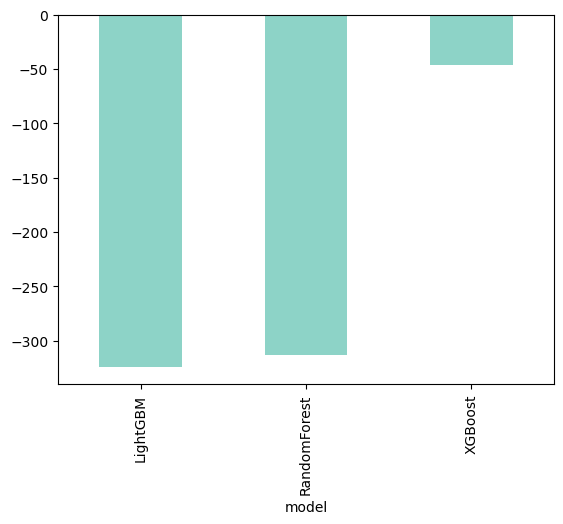

In [46]:
result_data['rank'] = result_data.groupby('product')['best_score'].rank(ascending=False, method='first')
best_data = result_data[result_data['rank']==1]
best_data['best_params'] = best_data['best_params'].astype(str)
print ('Best Params:\n',best_data.groupby(['model','best_params'])['rank'].count().sort_values(ascending=False).head())

result_data.groupby('model')['best_score'].mean().plot.bar()

## Prediction:

In [47]:
deep_result = pd.DataFrame()
shallow_result = pd.DataFrame()
df = data_backup.copy()

# Create dummy columns before preprocessing
df[['relative_monthly_sales_cluster','relative_daily_sales_cluster','relative_monthly_offer_cluster','relative_store_cluster','type']] = 0

# df = df[df['product_type'].isin(msp_list)]

unique_products = df['product_type'].unique()

for product_type in unique_products:
    
    product_data = df.loc[(df['product_type'] == product_type)]
    product_data = product_data.reset_index(drop=True)
    
    # train test split
    product_train = product_data[product_data['date'].dt.to_period('M')<='2017-07']
    product_train['type'] = 'Training Set'
    product_train = product_train[product_train['date']>=product_train['start_date']]
    product_train['date'] = product_train['date'].apply(lambda x: x.toordinal())
    product_train['start_date'] = product_train['start_date'].apply(lambda x: x.toordinal())
    
    product_test = product_data[product_data['date'].dt.to_period('M')>'2017-07']
    product_test['type'] = 'Test Set'
    product_test['date'] = product_test['date'].apply(lambda x: x.toordinal())
    
    # Preprocessing
    preprocessing_start = time.time()
    
    preprocessor_train = ModelPreprocessing(product_train, level = 'product_type')
    preprocessor_test = ModelPreprocessing(product_test, level = 'product_type')
    
    # adding lag features
    preprocessor_train.set_lag_feature(preprocessor_train.dataset,['product_type','store_nbr','week_num','year'], 'sales', 'lag_yoy_sales', method='yearly')
    preprocessor_test.set_lag_feature(preprocessor_train.dataset,['product_type','store_nbr','week_num','year'], 'sales', 'lag_yoy_sales', method='yearly')    
    
    # selecting range
    preprocessor_train.set_range('2015-07', 'date')

    # drop outliers
    preprocessor_train.drop_outliers('sales', 'special_offer', 'month')
    
    # cluster columns creation
    monthly_sales_cluster = preprocessor_train.get_freq_group_cluster('relative_monthly_sales_cluster', 'month', 'sales')
    preprocessor_train.set_freq_group_cluster(monthly_sales_cluster, 'relative_monthly_sales_cluster', 'month')
    
    daily_sales_cluster = preprocessor_train.get_freq_group_cluster('relative_daily_sales_cluster', 'day', 'sales',10)
    preprocessor_train.set_freq_group_cluster(daily_sales_cluster, 'relative_daily_sales_cluster', 'day')
    
    monthly_offer_cluster = preprocessor_train.get_freq_group_cluster('relative_monthly_offer_cluster', 'month', 'special_offer')
    preprocessor_train.set_freq_group_cluster(monthly_offer_cluster, 'relative_monthly_offer_cluster', 'month')
    
    store_cluster = preprocessor_train.get_store_cluster('relative_store_cluster','store_nbr','sales')
    preprocessor_train.set_store_cluster(store_cluster,'relative_store_cluster','store_nbr')
    
    # drop special offer cluster if not effective
    is_offer_effective = preprocessor_train.is_special_offer_effective('relative_monthly_offer_cluster',['special_offer', 'sales'])
    
    
    
    # apply clusters based on train data
    
    preprocessor_test.set_freq_group_cluster(monthly_sales_cluster, 'relative_monthly_sales_cluster', 'month')
    preprocessor_test.set_freq_group_cluster(daily_sales_cluster, 'relative_daily_sales_cluster', 'day')
    preprocessor_test.set_freq_group_cluster(monthly_offer_cluster, 'relative_monthly_offer_cluster', 'month')
    preprocessor_test.set_store_cluster(store_cluster,'relative_store_cluster','store_nbr')
           
    
    # remove inactive products for test set
    zero_prediction_dataset = preprocessor_test.is_product_active('store_nbr')
    zero_prediction_dataset['predicted_sales'] = 0

    
    if is_offer_effective==False:            
            preprocessor_test.dataset.drop('relative_monthly_offer_cluster', axis=1, inplace=True)
            zero_prediction_dataset.drop('relative_monthly_offer_cluster', axis=1, inplace=True)
            
    
    
    
    non_selected_features = ['id','product_type','special_offer','week_num','type','sales','start_date','date','day','store_nbr']
    
    # applying model
    model_training_start = time.time()
    

    model_xgb = XGBRegressor(random_state = 42, learning_rate = 0.1, max_depth = 10, n_estimators=100) 
                     
    
    
    model_xgb.fit(preprocessor_train.dataset.drop(non_selected_features,axis=1), preprocessor_train.dataset['sales'])
    


    model_prediction_start = time.time()
    y_pred_xgb = model_xgb.predict(preprocessor_test.dataset.drop(non_selected_features,axis=1))
    
    # Print time performance 
    print("Data Preprocessing for", product_type, "took", round((model_training_start-preprocessing_start),1), "Seconds!")
    print("Model Training for", product_type, "took", round((model_prediction_start-model_training_start),1), "Seconds!")
    
    
    rmse_xgb = np.sqrt(mean_squared_error(preprocessor_test.dataset['sales'], y_pred_xgb))
    mae_xgb = mean_absolute_error(preprocessor_test.dataset['sales'], y_pred_xgb)
    r2_xgb = r2_score(preprocessor_test.dataset['sales'], y_pred_xgb)
    
    
    # Storing individual results
    result_data = preprocessor_test.dataset.copy()
    result_data['predicted_sales'] = y_pred_xgb
    result_data['error'] = result_data['predicted_sales'] - result_data['sales']
    zero_prediction_dataset['error'] = zero_prediction_dataset['predicted_sales'] - zero_prediction_dataset['sales']

    deep_result = pd.concat([deep_result, result_data, zero_prediction_dataset[result_data.columns]])
    
    # Storing Overall results
    shallow_result_data = pd.DataFrame([{'product_type': product_type, 'avg_sales': result_data['sales'].mean(), 'avg_predicted_sales': result_data['predicted_sales'].mean(), 'mae': mae_xgb, 'rmse': rmse_xgb, 'r2': r2_xgb}]) 
    shallow_result = pd.concat([shallow_result, shallow_result_data])

print ('Features Taken:', preprocessor_train.dataset.drop(non_selected_features,axis=1).columns)

for column in ['avg_sales','avg_predicted_sales','mae','rmse','r2']:
    shallow_result[column] = np.round(shallow_result[column].astype(float),2)
deep_result['date'] = deep_result['date'].apply(lambda x: date.fromordinal(x))

Data Preprocessing for AUTOMOTIVE took 1.3 Seconds!
Model Training for AUTOMOTIVE took 1.4 Seconds!
Data Preprocessing for BABY CARE took 0.7 Seconds!
Model Training for BABY CARE took 1.5 Seconds!
Data Preprocessing for BEAUTY took 1.3 Seconds!
Model Training for BEAUTY took 1.5 Seconds!
Data Preprocessing for BEVERAGES took 0.7 Seconds!
Model Training for BEVERAGES took 1.5 Seconds!
Data Preprocessing for BOOKS took 0.4 Seconds!
Model Training for BOOKS took 0.9 Seconds!
Data Preprocessing for BREAD/BAKERY took 0.9 Seconds!
Model Training for BREAD/BAKERY took 1.9 Seconds!
Data Preprocessing for CELEBRATION took 0.7 Seconds!
Model Training for CELEBRATION took 1.8 Seconds!
Data Preprocessing for CLEANING took 0.9 Seconds!
Model Training for CLEANING took 3.8 Seconds!
Data Preprocessing for DAIRY took 0.7 Seconds!
Model Training for DAIRY took 1.3 Seconds!
Data Preprocessing for DELI took 0.7 Seconds!
Model Training for DELI took 1.3 Seconds!
Data Preprocessing for EGGS took 0.9 Secon

# Performance Evaluation

In [56]:
print (preprocessor_train.dataset.drop(non_selected_features,axis=1).columns)

Index(['year', 'month', 'dow', 'lag_yoy_sales',
       'relative_monthly_sales_cluster', 'relative_daily_sales_cluster',
       'relative_monthly_offer_cluster', 'relative_store_cluster'],
      dtype='object')


## Overall Result

In [48]:
other_shallow_result = (shallow_result[~shallow_result['product_type'].isin(msp_list)]).copy()

other_results = pd.DataFrame([{'product_type': 'OTHERS'
                              , 'avg_sales': np.round(other_shallow_result['avg_sales'].mean(),2)
                              , 'avg_predicted_sales': np.round(other_shallow_result['avg_predicted_sales'].mean(),2)
                              , 'mae': np.round(other_shallow_result['mae'].mean(),2)
                              , 'rmse': np.round(other_shallow_result['rmse'].mean(),2)}])

tuned_shallow_result = pd.concat([shallow_result[shallow_result['product_type'].isin(msp_list)].drop('r2',axis=1), other_results])
tuned_shallow_result

,product_type,avg_sales,avg_predicted_sales,mae,rmse
0,BEVERAGES,3469.02,3576.01,751.68,1084.93
0,CLEANING,1204.76,1301.95,314.43,527.65
0,DAIRY,832.77,884.40,118.71,182.63
0,GROCERY I,4580.49,4569.45,677.03,1027.26
0,PRODUCE,2290.86,2254.22,313.27,476.31
0,OTHERS,107.01,107.38,24.57,44.98


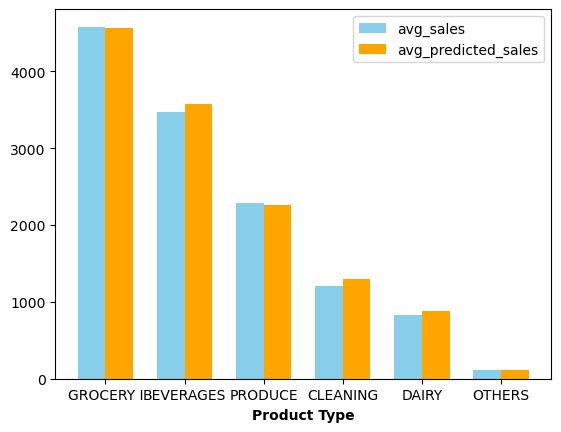

In [49]:
bar_width = 0.35

r1 = np.arange(len(tuned_shallow_result))
r2 = r1+0.35

tuned_shallow_result= tuned_shallow_result.sort_values(by='avg_sales', ascending=False)

plt.bar(r1, tuned_shallow_result['avg_sales'], color='skyblue', width=bar_width, label='avg_sales')
plt.bar(r2, tuned_shallow_result['avg_predicted_sales'], color='orange', width=bar_width, label='avg_predicted_sales')

plt.xlabel('Product Type', fontweight='bold')
plt.xticks((r1+r2)/2, tuned_shallow_result['product_type'])

plt.legend()
plt.show()

## Daily Prediction Evaluation

### Sales vs Prediction Trend

In [50]:
def plot_result(result, level, graph, data_dict, iterator, graphs_per_row=3):
    num_rows = math.ceil(len(iterator)/graphs_per_row)
    num_cols = min(len(iterator),graphs_per_row)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), sharex=True)
    sns.set_palette("Set1")
    for i, row in enumerate(iterator):
        row_idx = i//graphs_per_row
        col_idx = i%graphs_per_row

        tmp_result = result[result[level] == row]
 
        for j in data_dict['data']:
            if graph=='line':
                axes[row_idx,col_idx].plot(tmp_result[j['x']], tmp_result[j['y']], label=j['label'], color = j['color'])
            axes[row_idx,col_idx].set_xlabel(data_dict['x_label'])
            axes[row_idx,col_idx].set_ylabel(data_dict['y_label'])
            axes[row_idx,col_idx].set_title(data_dict['title']+row)
            axes[row_idx,col_idx].legend()

    plt.tight_layout()
    plt.show()

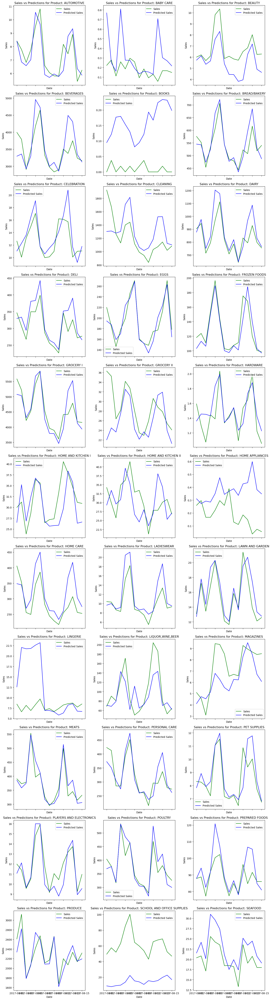

In [51]:
product_result = deep_result.groupby(['product_type','date'])[['sales','predicted_sales','error']].mean().reset_index()

plot_result(product_result, level='product_type', graph='line', 
            data_dict = {'data': [{'x': 'date', 'y': 'sales', 'label': 'Sales', 'color': 'green'},
                         {'x': 'date', 'y': 'predicted_sales', 'label': 'Predicted Sales' , 'color': 'blue'}], 
                         'x_label': 'Date',
                         'y_label': 'Sales',
                         'title': 'Sales vs Predictions for Product: '},
            iterator = product_result['product_type'].unique())

### Percentage Deviation

In [52]:
deep_result['deviation'] = (deep_result['error']/np.where(deep_result['sales']==0,1,deep_result['sales']*0.01))
deep_result['deviation'].fillna(0,inplace=True)

date_result = np.round(pd.pivot_table(deep_result, index = 'product_type', columns = 'date', values='deviation'),2)
date_result

date,2017-08-01,2017-08-02,2017-08-03,2017-08-04,2017-08-05,2017-08-06,2017-08-07,2017-08-08,2017-08-09,2017-08-10,2017-08-11,2017-08-12,2017-08-13,2017-08-14,2017-08-15
product_type,,,,,,,,,,,,,,,
AUTOMOTIVE,30.81,33.90,34.36,40.64,35.31,4.98,12.38,18.14,32.58,35.29,7.64,67.03,59.42,52.82,28.11
BABY CARE,-6.80,-7.92,-3.86,2.39,-5.15,-9.69,-11.40,-7.43,-4.67,-4.13,-9.04,29.16,-6.77,-4.49,-2.60
BEAUTY,25.45,37.75,13.58,21.72,20.32,14.71,12.63,9.21,-1.70,-3.17,-5.21,12.17,38.50,14.31,-5.57
BEVERAGES,-15.20,-9.44,3.55,-0.61,23.37,12.86,6.86,6.05,13.50,4.21,4.93,35.34,28.04,8.78,5.76
BOOKS,0.09,3.38,0.18,3.91,0.15,1.93,0.08,2.01,-0.48,0.19,0.17,0.22,1.59,0.23,0.20
BREAD/BAKERY,-6.12,-2.69,5.39,0.31,8.51,8.87,0.94,-1.71,0.92,0.35,0.50,19.01,15.56,2.13,-5.67
CELEBRATION,33.84,50.34,55.34,39.07,48.16,50.71,52.52,42.11,56.58,12.07,36.58,82.25,62.51,52.91,53.75
CLEANING,-26.35,-17.39,29.64,24.83,34.82,35.28,11.08,11.52,8.85,29.38,24.18,47.41,38.10,13.22,14.21
DAIRY,0.25,5.99,6.22,8.35,26.22,12.61,5.22,5.82,6.92,3.71,-5.85,21.37,22.60,7.04,2.41


### Percentage Deviation for Most Selling Products (MSP)

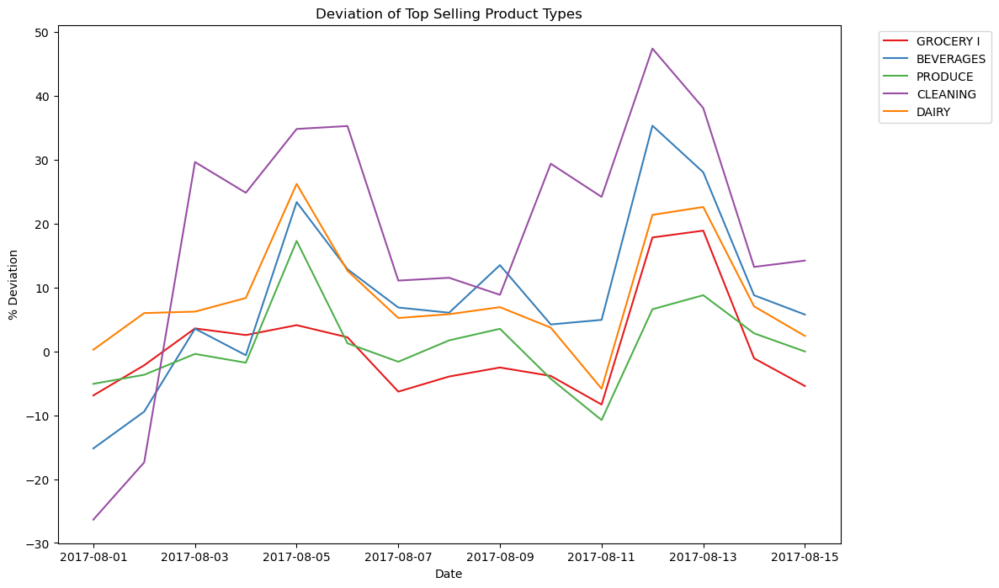

In [53]:
data_result_transposed = date_result.transpose()

plt.figure(figsize=(12, 8))

for product_type in msp_list:
    plt.plot(data_result_transposed.index, data_result_transposed[product_type], label=product_type)

plt.xlabel('Date')
plt.ylabel('% Deviation')
plt.title('Deviation of Top Selling Product Types')

plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))

plt.show()

### Percentage Deviation for Critical Products (Low Shelf Life) 

In [ ]:
# Low shelf life products have been assumed according to domain knowledge

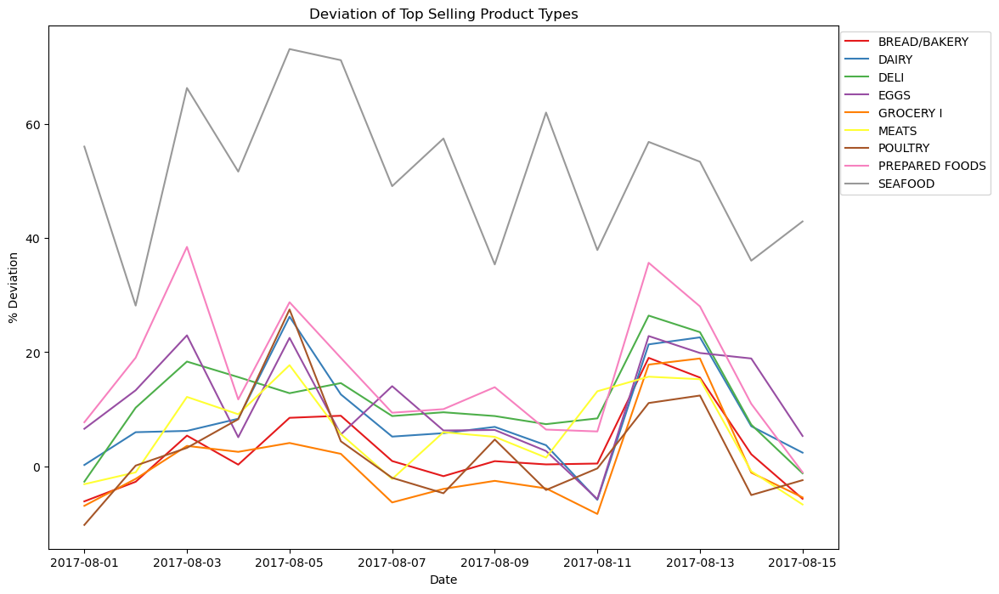

In [54]:
# In days
shelf_life_mapping = {'BREAD/BAKERY' : 5
                           ,'DAIRY' : 3
                           ,'DELI': 3
                           ,'EGGS':10
                           ,'GROCERY I':3
                           ,'MEATS':3
                           ,'POULTRY':3
                           ,'PREPARED FOODS':2
                           ,'SEAFOOD':5}
plt.figure(figsize=(12, 8))

for product_type in shelf_life_mapping:
    plt.plot(data_result_transposed.index, data_result_transposed[product_type], label=product_type)

plt.xlabel('Date')
plt.ylabel('% Deviation')
plt.title('Deviation of Top Selling Product Types')

plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))

plt.show()

# Possible 0 to minimal wastage

### Out of Stock Evaluation

In [55]:
oos_dataset = deep_result.copy()
oos_dataset['predicted_sales'] = oos_dataset['predicted_sales']
oos_dataset['oos_flag'] = ((oos_dataset['predicted_sales']-oos_dataset['sales'])<0).astype(int)
oos_report = np.round(oos_dataset.pivot_table(index = ['product_type'], columns = ['date'], values = ['oos_flag'], aggfunc = np.mean)*100,2)
oos_report

oos_flag                                   \
date                       2017-08-01 2017-08-02 2017-08-03 2017-08-04   
product_type                                                             
AUTOMOTIVE                      50.00      48.15      40.74      59.26   
BABY CARE                       14.81      14.81       7.41      14.81   
BEAUTY                          48.15      38.89      44.44      48.15   
BEVERAGES                       79.63      64.81      46.30      44.44   
BOOKS                            0.00       0.00       0.00       0.00   
BREAD/BAKERY                    57.41      61.11      37.04      51.85   
CELEBRATION                     57.41      33.33      35.19      42.59   
CLEANING                        94.44      83.33      40.74      24.07   
DAIRY                           59.26      35.19      40.74      33.33   
DELI                            57.41      33.33      25.93      31.48   
EGGS                            53.70      48.15      31.48      62.96   
FROZEN FOODS                    70.37      64.81      51.85      50.00   
GROCERY I                       64.81      57.41      42.59      40.74   
GROCERY II                      79.63      68.52      57.41      59.26   
HARDWARE                        48.15      33.33      25.93      40.74   
HOME AND KITCHEN I              59.26      37.04      35.19      33.33   
HOME AND KITCHEN II             59.26      51.85      38.89      46.30   
HOME APPLIANCES                 18.52      16.67      12.96      11.11   
HOME CARE                       77.78      48.15      33.33      11.11   
LADIESWEAR                      38.89      33.33      33.33      22.22   
LAWN AND GARDEN                 37.04      35.19      24.07      24.07   
LINGERIE                        38.89      35.19      42.59      37.04   
LIQUOR,WINE,BEER                31.48      62.96      48.15      29.63   
MAGAZINES                       61.11      46.30      31.48      40.74   
MEATS                           62.96      62.96      44.44      50.00   
PERSONAL CARE                   70.37      57.41      29.63      50.00   
PET SUPPLIES                    44.44      38.89      42.59      35.19   
PLAYERS AND ELECTRONICS         53.70      31.48      40.74      48.15   
POULTRY                         72.22      59.26      57.41      42.59   
PREPARED FOODS                  44.44      35.19      29.63      42.59   
PRODUCE                         68.52      62.96      46.30      48.15   
SCHOOL AND OFFICE SUPPLIES      40.74      37.04      38.89      38.89   
SEAFOOD                         37.04      29.63      29.63      20.37   

                                                                        \
date                       2017-08-05 2017-08-06 2017-08-07 2017-08-08   
product_type                                                             
AUTOMOTIVE                      33.33      61.11      59.26      53.70   
BABY CARE                        9.26      14.81      18.52      16.67   
BEAUTY                          62.96      53.70      61.11      64.81   
BEVERAGES                       24.07      48.15      37.04      37.04   
BOOKS                            0.00       0.00       0.00       0.00   
BREAD/BAKERY                    35.19      46.30      50.00      66.67   
CELEBRATION                     40.74      40.74      35.19      37.04   
CLEANING                        14.81      16.67      29.63      35.19   
DAIRY                           11.11      37.04      37.04      38.89   
DELI                            31.48      31.48      35.19      25.93   
EGGS                            31.48      53.70      37.04      44.44   
FROZEN FOODS                    59.26      51.85      50.00      51.85   
GROCERY I                       40.74      51.85      70.37      50.00   
GROCERY II                      46.30      57.41      64.81      61.11   
HARDWARE                        33.33      42.59      42.59      38.89   
HOME AND KITCHEN I              